# Behavioral Training

The objective of this project is to train a Convolutional Neural Network to successfully drive a car around a track. This will be done by feeding the model with a live feed of images showing the central frontal view from the car and returning the appropriate steering angle with a constant throttle. 

To train the model, we will be recording the appropriate data from a set of laps by manually around the track. To increase the diversity of data, we will drive both clockwise and counterclockwise/anticlockwise and we will also record recovery data (getting back on track from unwanted positions). 

This data will be divided in two sets: 70% will be used as training data and the remaining 30% is used as cross-validation data to help avoid overfitting during the training process.
 
Additionally, we will also be recording a small set of data on the alternative track to see how does it respond, both numerically and in a simulation to our model.


# Load Data

In [1]:
import numpy as np
import pandas as pd

from PIL import Image, ImageChops
import random

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split

from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Lambda, ELU
from keras.layers.convolutional import Convolution2D, MaxPooling2D, AveragePooling2D
from keras.layers.normalization import BatchNormalization
from keras.callbacks import EarlyStopping

from ipywidgets import IntProgress, Layout, Box, Label
from IPython.display import display

# Globals
_FOLDER_ = "train_data/"
_FOLDER_CV_ = "val_data/"
_LOG_ = "driving_log.csv"

# Model Parameters
new_data_multiplier = 4 # Data increment ratio due to aumentation
test_size = 0.33
epochs = 10
batch = 64
lrate = 0.0001
img_height_start = 64
img_height_end = 160

# ProgressBar Layout Config
bar_layout = Layout( 
    flex='1 1 auto', 
    align_self='center'
)
label_layout = Layout(
    flex='1 0 auto', 
    align_self='center'
)
box_layout = Layout(
    border='1px solid #999',
    display='flex', 
    flex_flow="row", 
    align_items='stretch',
    width='50%'
)

Using TensorFlow backend.


In [2]:
#LOAD LOG DATA
log_data = pd.read_csv(_FOLDER_ + _LOG_, header = None )
log_data.columns = header=["Center Image", "Left Image", "Right Image", "Steering Angle", "Throttle", "Break", "Speed"]

target = log_data["Steering Angle"]
data = log_data["Center Image"]

#LOAD LOG DATA RECORDED FROM BOTH TRACKS
log_cv_data = pd.read_csv(_FOLDER_CV_ + _LOG_, header = None )
log_cv_data.columns = header=["Center Image", "Left Image", "Right Image", "Steering Angle", "Throttle", "Break", "Speed"]

other_target = log_cv_data["Steering Angle"]
other_data = log_cv_data["Center Image"]

## Exploratory Analysis

Target Values Description
count    62747.000000
mean        -0.009218
std          0.196008
min         -1.000000
25%         -0.045803
50%          0.000000
75%          0.012007
max          1.000000
Name: Steering Angle, dtype: float64


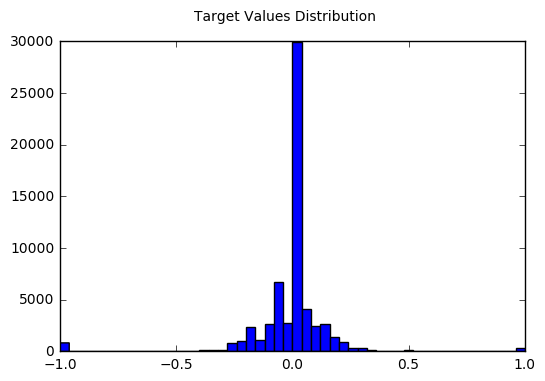

In [3]:
print("Target Values Description\n{}".format(log_data["Steering Angle"].describe()))

plt.figure()
plt.suptitle("Target Values Distribution")
plt.hist(target,bins=50)
plt.show()

Due to the nature of the track, most of the steering angles have values around zero as it is clearly seen in the value distribution. It is also worth mentioning that there is a minor lean to negative angles as a consequence of the default driving direction as noted in the description of the distribution (negative mean and uneven quartiles). 

This might create a predisposition towards zero in the model but the amount of data and the structure of the model should compensate this unbalance.

## Data Management and Aumentation

To lower the complexity of the model, we will discard the top 64 pixels of the image. The idea is that to produce a viable driving model to go around the track, the most important information comes from the road and everything above the horizon line is superfluous information that will only slow the process and increase the model's complexity. 

A quick analysis of some images showed that the 64 pixels' line was an appropriate general approximation for the horizon line and produce a resulting image with a height of 96 pixels that is numerically convinient.


To increase the richness of the data and to make the model more robust to different conditions, three data augmentation methods have been implemented.
* Offsetting each image both by random factor between -5 and 5 in the horizontal direction, and also by another random factor between -5 and 5 in the vertical direction
* Creating a darker copy of the image by using the multiplication method on itself
* Creating a lighter copy of the image by using the screen method on itself


*More information on the multiply and screen methods: [http://effbot.org/imagingbook/imagechops.htm](http://effbot.org/imagingbook/imagechops.htm)*


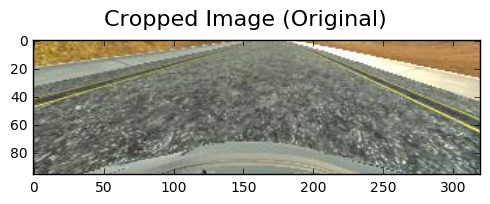

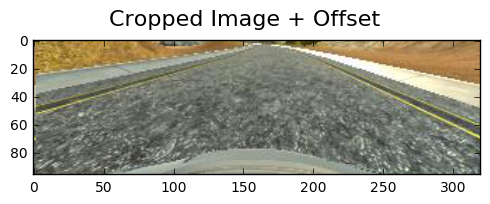

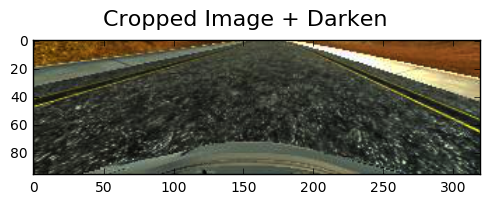

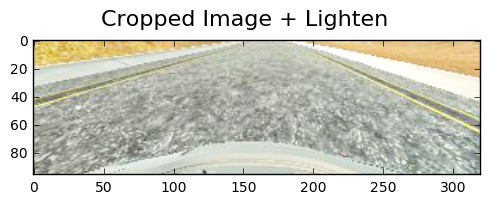

In [4]:
def ShowImage(out_img, title):
    plt.figure(figsize=(5,2.05))
    display = plt.imshow(out_img)
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show(display)   

# Display Aumentation Methods
image = Image.open(data[0])
image_array = np.asarray(image)
out_img = image_array[img_height_start:img_height_end,:,:] # use only lower segment of the image
ShowImage(out_img, "Cropped Image (Original)")


# DATA AUMENTATION
# ADD a randomly offseted copy of the image
image_modify = ImageChops.offset(image, random.randint(-5,5), random.randint(-5,5))
image_array = np.asarray(image_modify)
out_img =  image_array[img_height_start:img_height_end,:,:]
ShowImage(out_img, "Cropped Image + Offset")

# ADD darker version of the image (multiply by itself)
image_modify = ImageChops.multiply(image, image)
image_array = np.asarray(image_modify)
out_img =  image_array[img_height_start:img_height_end,:,:]
ShowImage(out_img, "Cropped Image + Darken")

# ADD lighter version of the image (screen by itself)
image_modify = ImageChops.screen(image, image)
image_array = np.asarray(image_modify)
out_img =  image_array[img_height_start:img_height_end,:,:]
ShowImage(out_img, "Cropped Image + Lighten")

Since the amount of data can create memory issues when trying to load all images, a Generator method is implemented to only load the required data for each batch and apply the data management and augmentation methods. 

The generator fills a fourth (*1/new_data_multiplier*) of each batch with recorded images and completes the rest by doing augmentation.

In [5]:
def GetImageArray(source):
    X = np.empty( (len(source), img_height_end - img_height_start, 320, 3) )

    for j in range(len(source)):
        image = Image.open(source[j])
        image_array = np.asarray(image)
        X[j] = image_array[img_height_start:img_height_end,:,:]
    
    return X

X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=test_size, stratify=np.around(target,decimals=1) )

y_other = other_target
X_other = GetImageArray(other_data)


print("Train Data: {}\nCross-validation Data: {}".format(len(y_train), len(y_test)))

Train Data: 42040
Cross-validation Data: 20707


In [6]:
def Generator(X_input, y_input, augmentation, title):
    
    # Set size multiplier depending on whether it needs to perform data augmentation
    m = 1
    if(augmentation):
        m = new_data_multiplier
    
    # Set method "constants"
    new_batch = (int)(batch / m)
    batches = (int)(len(y_input) / new_batch) + 1
    warn_sign = (int)(batches / 20)
    
    log_bars = []
    while(1):
        # Display Progress Bar
        bar = IntProgress(min=0, max=batches, value=0, layout=bar_layout)
        log_bars.append(bar)
        
        label = Label(value="{} [{}]".format(title, len(log_bars)), layout=label_layout)
        
        items = [label, bar]
        
        box = Box(children=items, layout=box_layout)
        display(box)

        for i in range(batches):
            # Update Progression Bar
            log_bars[len(log_bars)-1].value = i
            
            # Check if there is a full batch available and take a batch // take the remaining data
            if ( (i+1) * new_batch < len(y_input) ):
                size = new_batch
            else:
                size = len(y_input) - (i * new_batch)
            
            # Check if size is not viable // Load data
            if (size < 0):
                print("Warning: Negative dimension \nsize {} from target length {}, batch size {}, index {}".format(size,len(y_input),batch,i))
            else:
                y = y_input[i * new_batch : i * new_batch + size]
                X = np.empty( (m * size, img_height_end - img_height_start, 320, 3) )

                for j in range(size):
                    image = Image.open(X_input[i * new_batch + j])
                    image_array = np.asarray(image)
                    X[j] = image_array[img_height_start:img_height_end,:,:] # use only lower segment of the image
                    
                    if (augmentation):
                        # DATA AUMENTATION
                        # ADD a randomly offseted copy of the image
                        image_modify = ImageChops.offset(image, random.randint(-5,5), random.randint(-5,5))
                        image_array = np.asarray(image_modify)
                        X[j + size] =  image_array[img_height_start:img_height_end,:,:]

                        # ADD darker version of the image (multiply by itself)
                        image_modify = ImageChops.multiply(image, image)
                        image_array = np.asarray(image_modify)
                        X[j + 2*size] =  image_array[img_height_start:img_height_end,:,:]

                        # ADD lighter version of the image (screen by itself)
                        image_modify = ImageChops.screen(image, image)
                        image_array = np.asarray(image_modify)
                        X[j + 3*size] =  image_array[img_height_start:img_height_end,:,:]
                
                if (augmentation):
                    #ADD target info for offset images
                    y = np.append(y, y_input[i * new_batch : i * new_batch + size]) 

                    #ADD target info for darker images
                    y = np.append(y, y_input[i * new_batch : i * new_batch + size]) 

                    #ADD target info for lighter images
                    y = np.append(y, y_input[i * new_batch : i * new_batch + size]) 
                
                yield X, y

# Model

<table>
<tr>
<td style="width:50%">
<img src="cnn-v2.png" style="width:100%">
</td>

<td style="vertical-align: top">

<p>The model is trained to minimize the mean-squared error between the output of the network and the steering angle recorded by manually driving arround the track on the simulator.</p>

<p>The arquitecture of the model is based on the structure used in End-to-End Deep Learning for self-Driving Cars<sup>[1]</sup>. To do feature reduction, we have substituted the subsample with max-pooling for a more controlled process and we have modified the sizes of the fully-connected layers.</p>

<p>These changes have been made through trial and error until a functional model that was obtained. Previous models failed to complete a loop on the track or showed signs of overfitting like rough driving (constant sharp course corrections)</p>

<p>The arquitecture of the model has three main stages:</p>

<ol>
<li>**Preprocess:** Transform the integer values from each layer on each image to decimal values in the range [-1,1], apply a batch normalization method and, finally, downsize the image by average pooling.</li>
<li>**Convolution Layers:** A series of convolution layers with max pooling.</li>
<li>**Fully Connected Layers:** A series of dense layers interconnected layers and dropout.</li>
</ol>

</td>
</tr>
</table>

<blockquote>[1] Firner, B., Flepp, B., Zieba, K., Jackel, L., Bojarski, M., & Muller, U. (2016, August 25). End-to-End Deep Learning for Self-Driving Cars. Retrieved January 23, 2017, from https://devblogs.nvidia.com/parallelforall/deep-learning-self-driving-cars/</blockquote>

In [8]:
model = Sequential()
# Normalize Image Values
model.add(Lambda(lambda x: x/127.5 - 1, batch_input_shape=(None,img_height_end - img_height_start,320,3)))
model.add(BatchNormalization(mode=1, axis=-1))
# Downscale Image 1/2
model.add(AveragePooling2D(pool_size = (2,2), strides=(2,2)))

# Convolution Layers
model.add(Convolution2D(24, 5, 5, border_mode="same", init='normal') )
model.add(MaxPooling2D(pool_size=(2,2), strides = (2,2)))
model.add(Convolution2D(32, 5, 5, border_mode="same", init='normal') )
model.add(MaxPooling2D(pool_size=(2,2), strides = (2,2)))
model.add(Convolution2D(48, 5, 5, border_mode="same", init='normal') )
model.add(MaxPooling2D(pool_size=(2,2), strides = (2,2)))

model.add(Convolution2D(64, 3, 3, border_mode="valid", init='normal') )
model.add(Convolution2D(128, 3, 3, border_mode="valid", init='normal') )
model.add(MaxPooling2D(pool_size=(2,2), strides = (2,2)))

# Fully Connected Layers
model.add(Flatten())
model.add(Dropout(.5))

model.add(Dense(512, init='normal'))
model.add(Dropout(.5))
model.add(Dense(256, init='normal'))
model.add(Dense(128, init='normal'))
model.add(Dense(1, bias=True, init='normal', activation="tanh"))

In [9]:
from keras.optimizers import SGD, Adam

#Compile Model
decay = lrate/epochs

#sgd = SGD(lr=lrate, decay=1e-6, momentum=0.9, nesterov=False)
adam = Adam(lr=lrate)
model.compile(loss='mse', optimizer=adam)
print(model.summary())

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_1 (Lambda)                (None, 96, 320, 3)    0           lambda_input_1[0][0]             
____________________________________________________________________________________________________
batchnormalization_1 (BatchNorma (None, 96, 320, 3)    6           lambda_1[0][0]                   
____________________________________________________________________________________________________
averagepooling2d_1 (AveragePooli (None, 48, 160, 3)    0           batchnormalization_1[0][0]       
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 48, 160, 24)   1824        averagepooling2d_1[0][0]         
___________________________________________________________________________________________

# Training
The model is trained to minimize the mean-squared error over the training dataset through 10 epochs and using batches of 64 samples to try to avoid overfitting.

Moreover, to help avoid overfitting, the training process might stop early if the improvement on the cross-validation dataset is consistently small enough.

In [10]:
check_stop = EarlyStopping(monitor='val_loss', min_delta = 0.001, patience = 1, mode='min')

model.fit_generator(Generator(X_train.values, y_train.values, True, "Train Data"),
          samples_per_epoch = len(y_train) * new_data_multiplier,
          nb_epoch = epochs,
          validation_data = Generator(X_test.values, y_test.values, False, "Validation Data"),
          nb_val_samples=len(y_test),
          verbose = 2,
          callbacks = [check_stop],
          nb_worker = 1)

Epoch 1/10
3670s - loss: 0.0349 - val_loss: 0.0249
Epoch 2/10
4154s - loss: 0.0248 - val_loss: 0.0231
Epoch 3/10
3717s - loss: 0.0227 - val_loss: 0.0220
Epoch 4/10
3606s - loss: 0.0212 - val_loss: 0.0214
Epoch 5/10
3413s - loss: 0.0199 - val_loss: 0.0206
Epoch 6/10
3612s - loss: 0.0187 - val_loss: 0.0203
Epoch 7/10
3414s - loss: 0.0177 - val_loss: 0.0198


In [11]:
# Save Architecture
file = open("model.json",'w')
file.write(model.to_json())
file.close()

# Save Weights
model.save_weights("model.h5")

In [30]:
print("Model performance on alternative circuit")
scores = model.evaluate(X_other, y_other)

print("Mean squared error: {}".format(scores))

Model performance on alternative circuit
7990/7990 [==============================] - 84s    
Mean squared error: 0.030681210743480167


## Evaluation
The training process faced an early stop as the numerical results did not show a significant improvement. Once tested this model on the test circuit, the car manages to complete thee laps and, thus, the model is considered functional.

The mean-squared error for the small set of data taken from both tracks is about twice as high as the obtained both over the training dataset and the cross-validation dataset and, once tested in the simulation, the model is not capable of completing the alternative track. 

# Intermediate Layer Output

Finally, it might be interesting to look at what each convolution is doing. Taking a look at a couple of pictures for each layer could help us theorize what it is doing, specially in the fist two convolutions where the output is still recognizable.

For example, in the first convolution, the outputs in (column 1, row 2) and (column 1, row 4) seem to be identifing the edges of the shoulder at the side of the road.

In [115]:
from keras.models import Model

def ShowLayer(name):
    intermediate_model = Model(input=model.input,
                              output=model.get_layer(name).output)

    index = random.randint(0, len(X_train))
    image = GetImageArray(X_train.values[index:index+1])
    output = intermediate_model.predict(image)

    size = ((int)(output.shape[-1]/4),4)


    plt.figure(figsize=(16,6))
    plt.imshow(256-image[0])
    plt.axis('off')
    plt.suptitle("{} layer outputs".format(name), fontsize=24)
    plt.tight_layout()
    
    plt.figure(figsize=(16,2*size[-1]))
    ax = []
    for i in range(output.shape[-1]):
        x = i%4
        y = 1 + (int)(i/4)
        ax.append( plt.subplot2grid(size, ((int)(i/4),i%4), colspan=1) )
        ax[i].imshow(256-output[0,:,:,i], cmap='gray', interpolation='nearest', aspect='auto')
        ax[i].axis('off')

    plt.show()

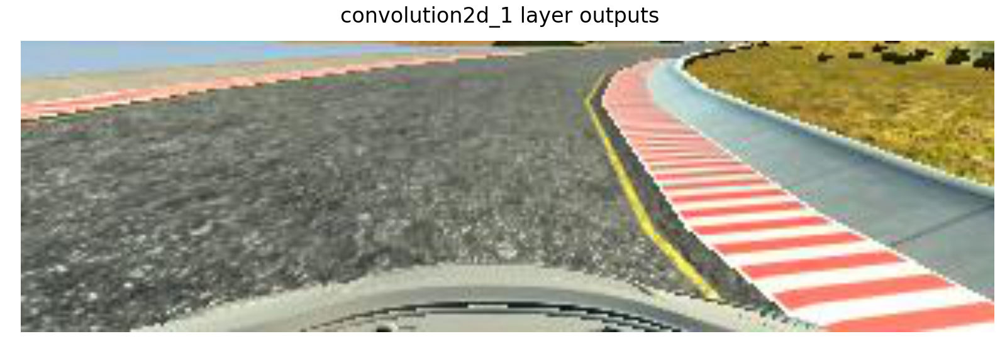

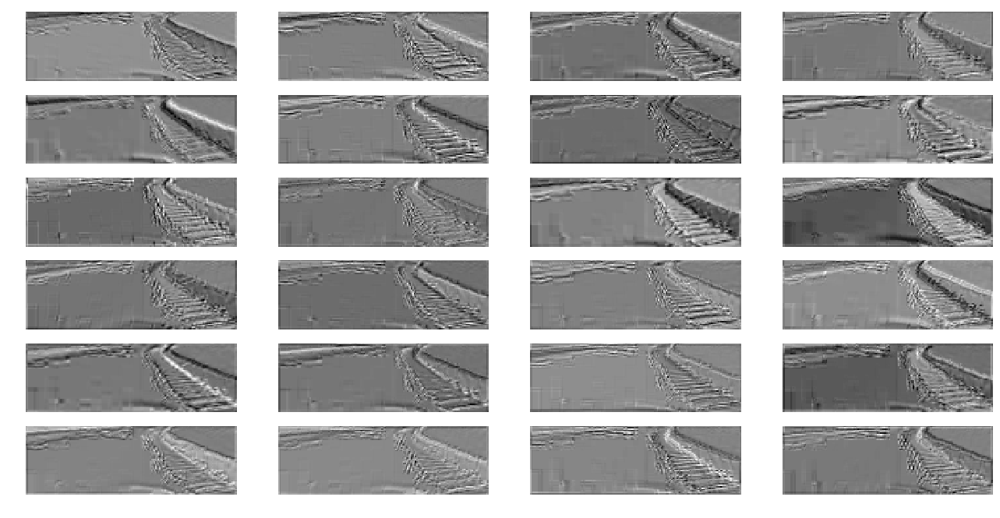

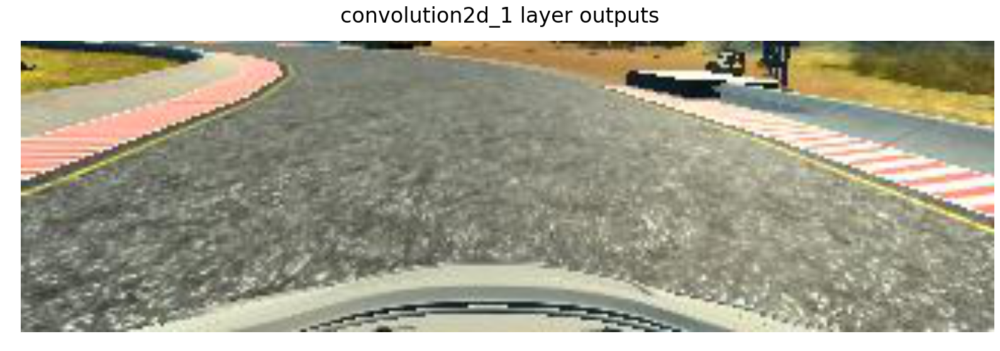

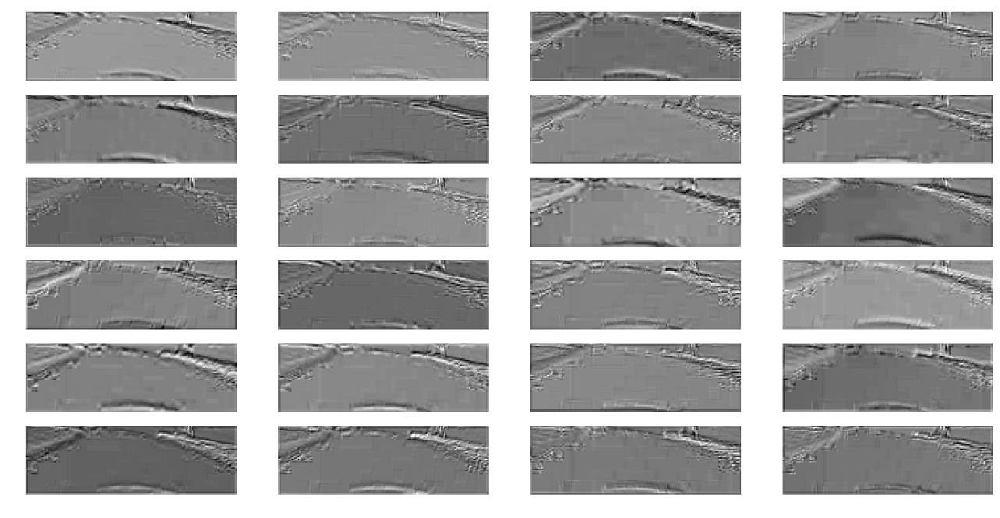

In [111]:
ShowLayer("convolution2d_1")
ShowLayer("convolution2d_1")

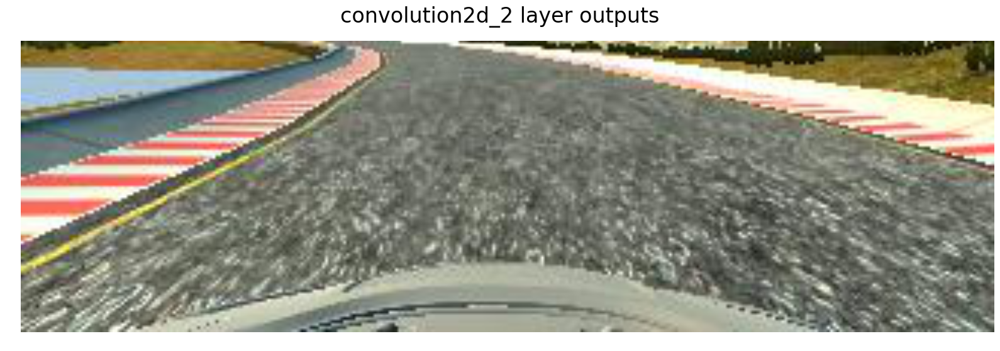

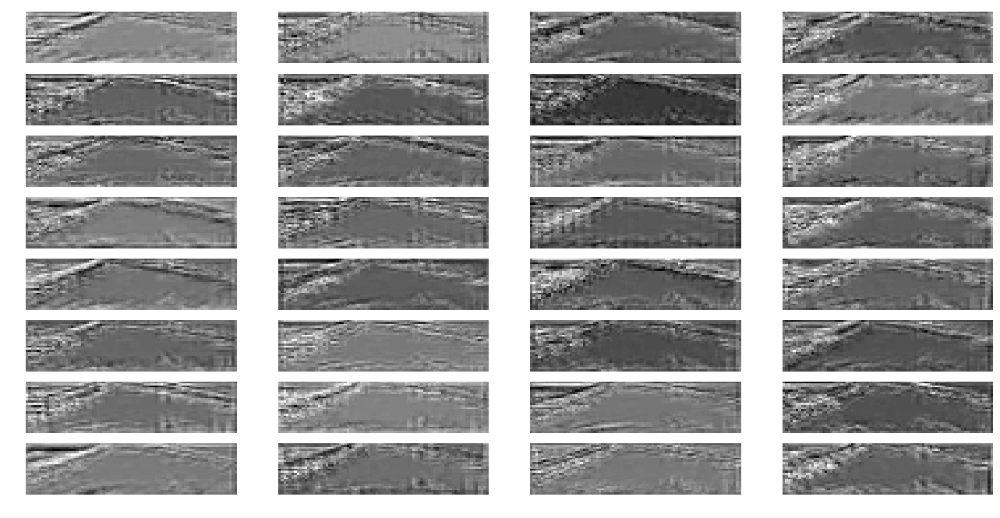

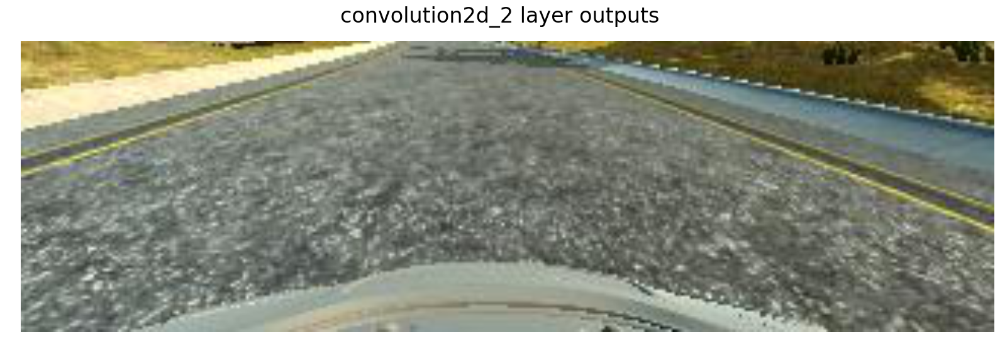

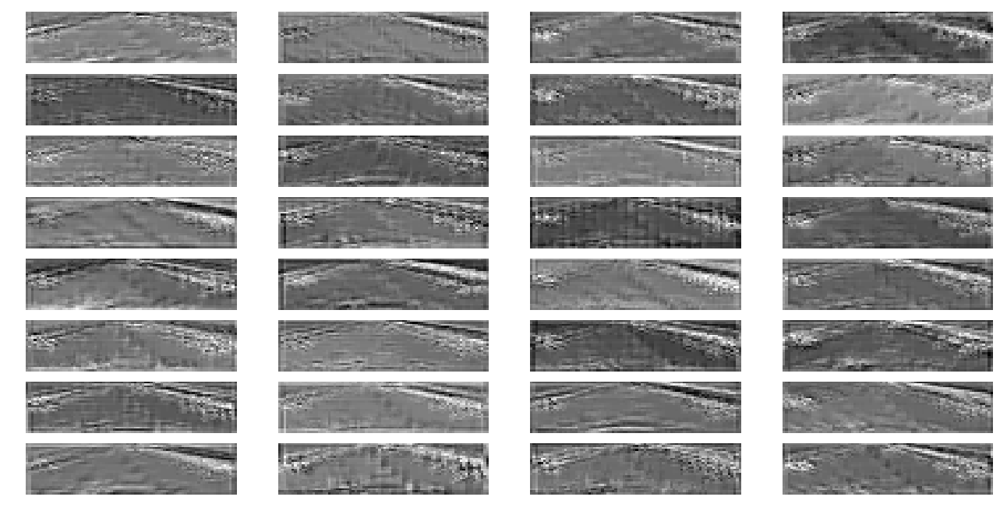

In [112]:
ShowLayer("convolution2d_2")
ShowLayer("convolution2d_2")

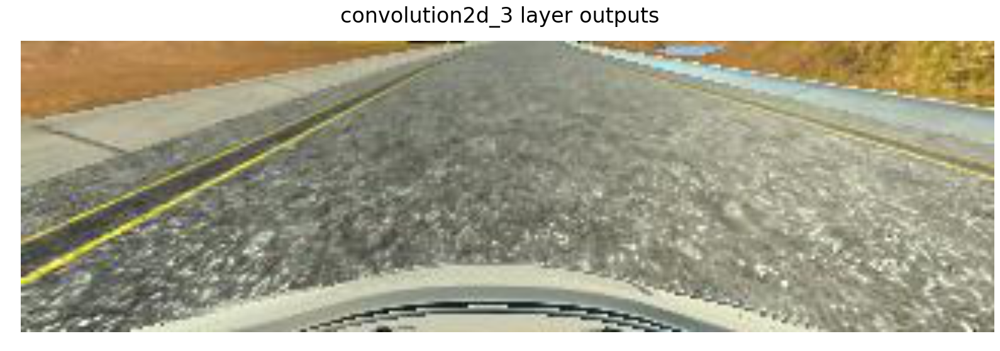

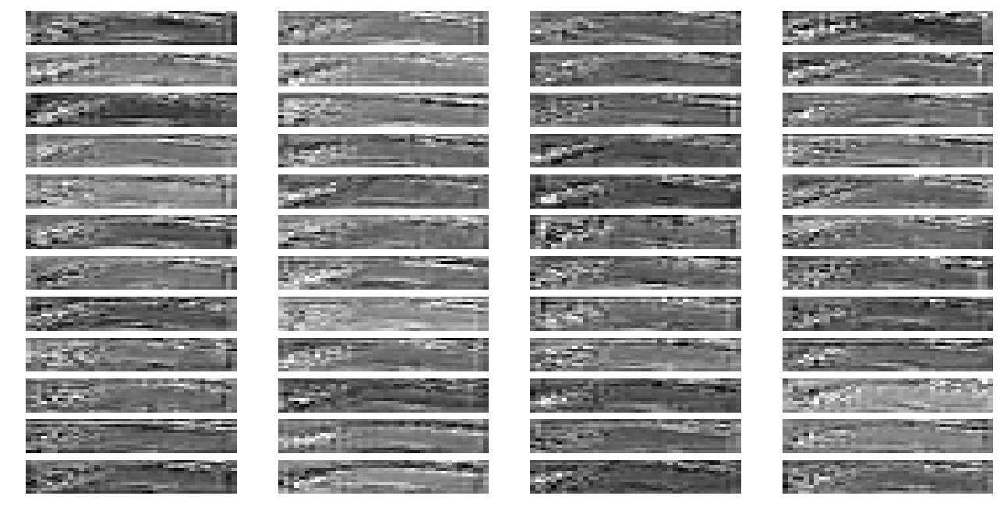

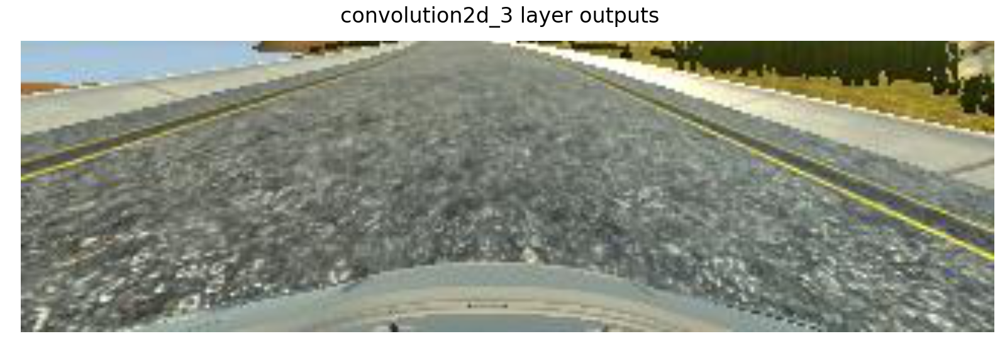

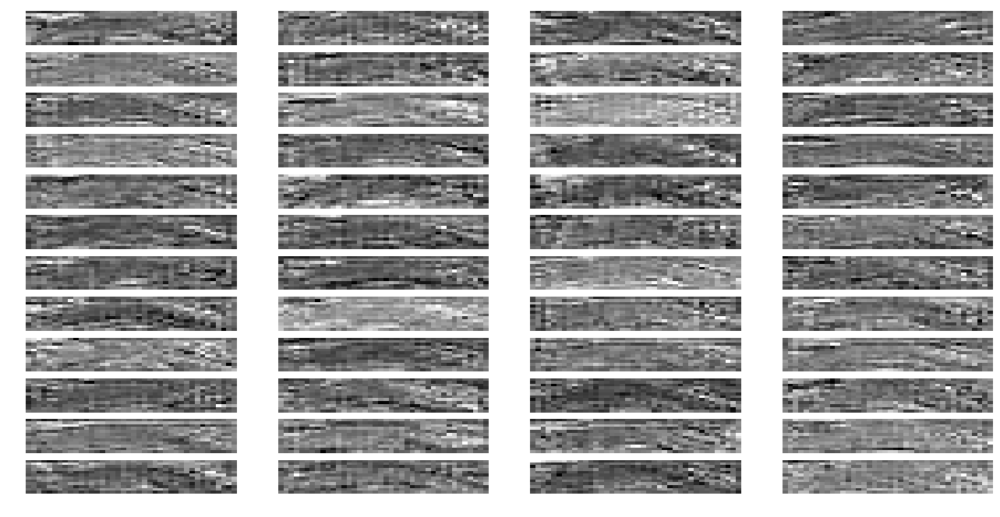

In [113]:
ShowLayer("convolution2d_3")
ShowLayer("convolution2d_3")

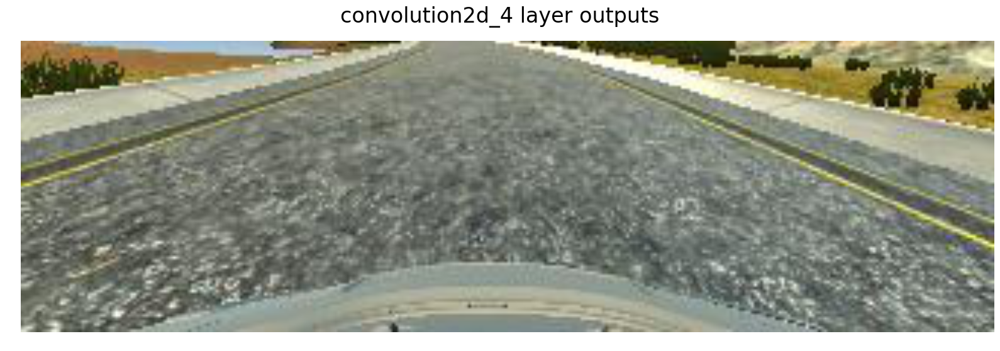

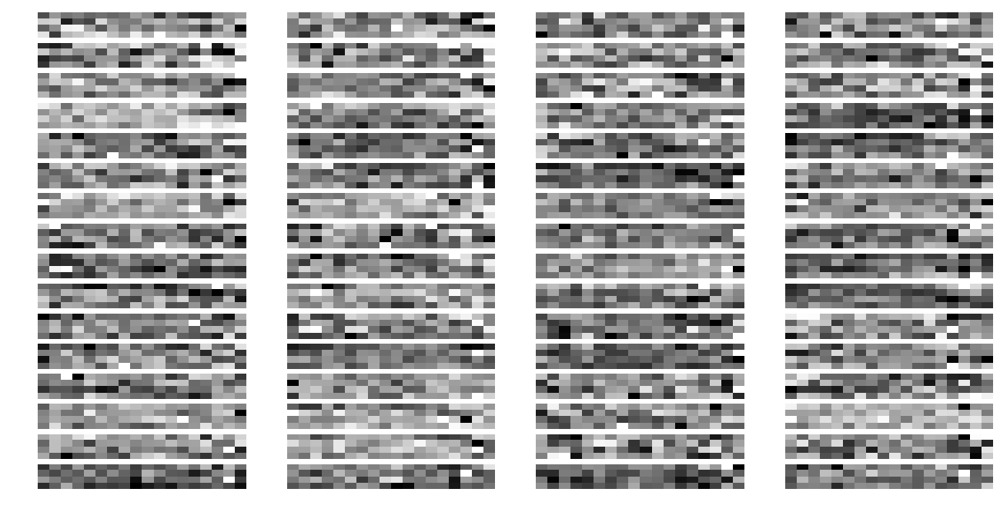

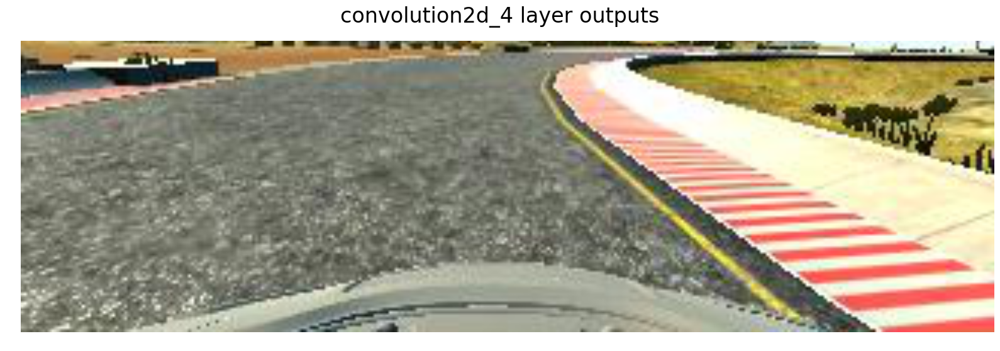

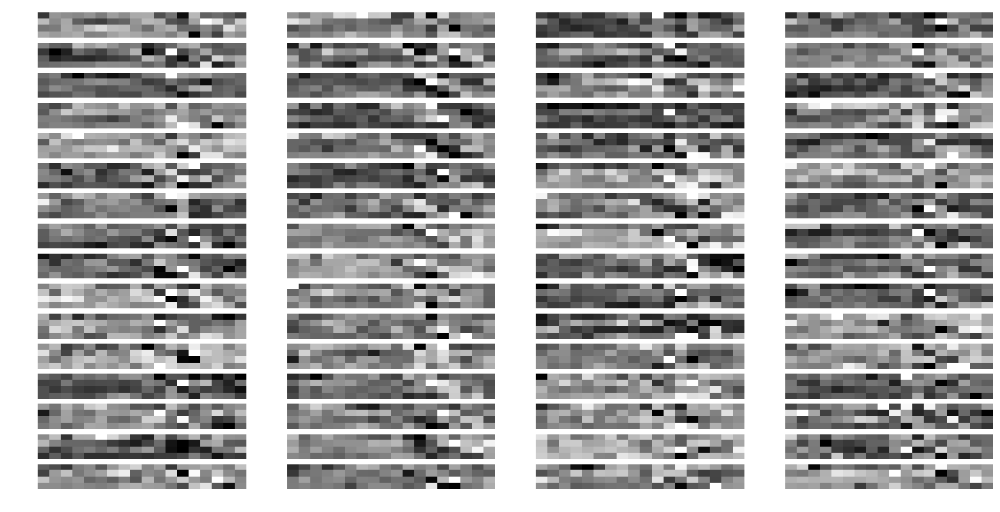

In [114]:

ShowLayer("convolution2d_4")
ShowLayer("convolution2d_4")

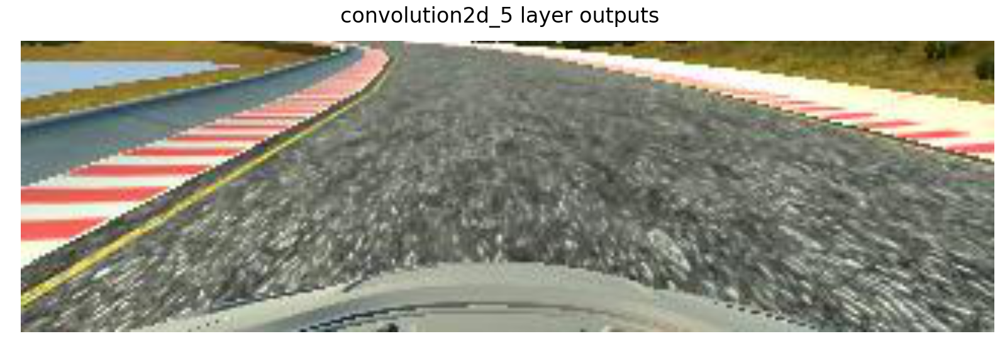

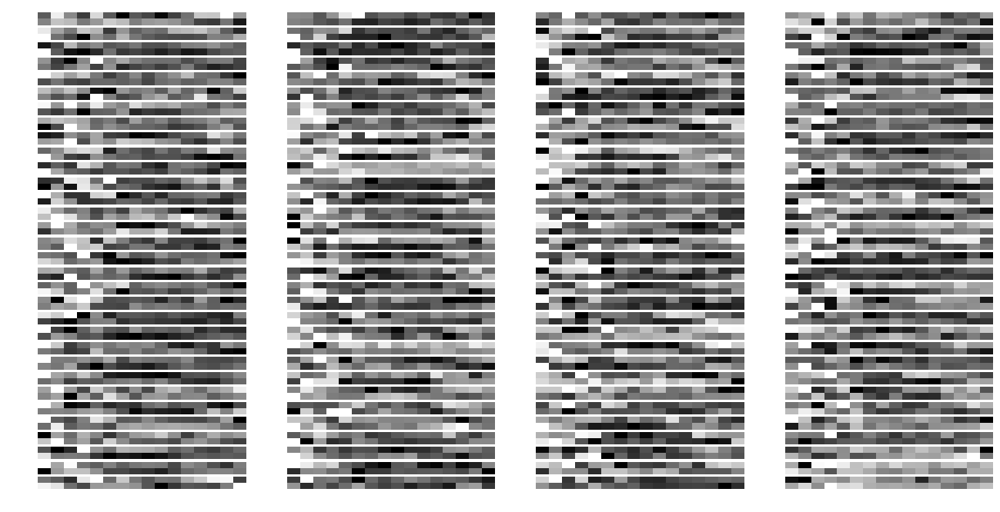

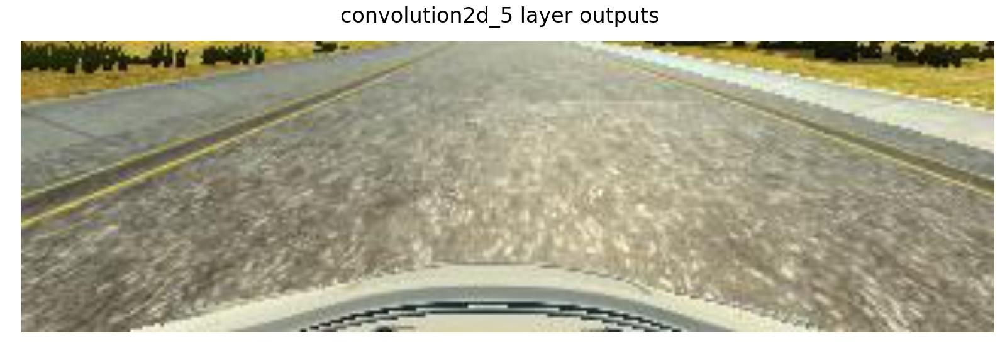

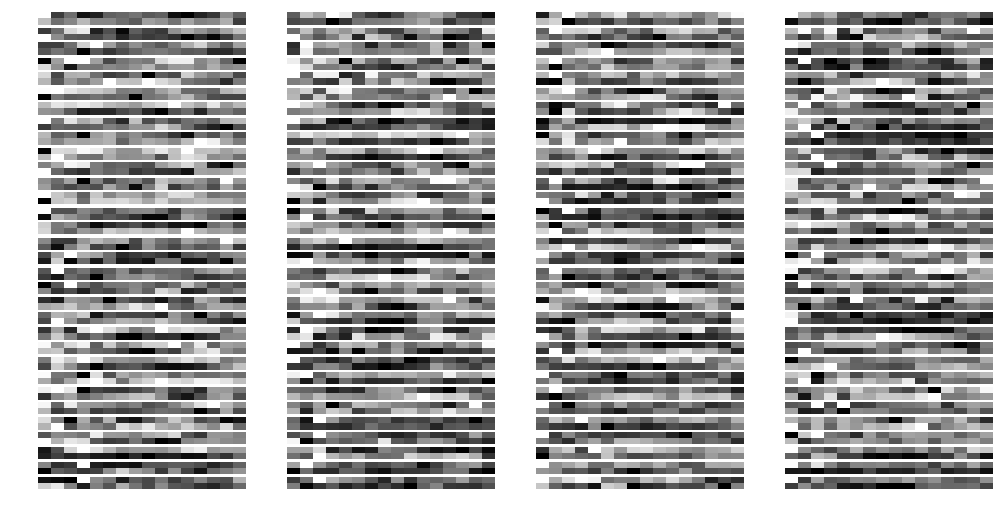

In [116]:

ShowLayer("convolution2d_5")
ShowLayer("convolution2d_5")